In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

2025-06-05 10:36:07.741329: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [7]:
from gan import (
    WGAN_GP,
    CWGAN_GP,
    CWGANMonitor,
    WGANMonitor,
    build_cwgan_generator,
    build_cwgan_discriminator,
    build_wgan_generator,
    build_wgan_discriminator,
)

In [3]:
from data_utils import (
    load_data,
    prepare_cwgangp_s_data,
    prepare_mts_s_data,
    reconstruct_synthetic_consecutive,
    plot_feature_tsne,
    plot_real_vs_fake,
    plot_gan_losses,
    plot_gan_training_metrics,
)

In [4]:
df_2 = load_data("data/price_subsampled_2_percent.csv")
cwgan_scaler, (X_train_cwgan, C_train_cwgan, P_train_cwgan), (X_test_cwgan, C_test_cwgan, P_test_cwgan) = prepare_cwgangp_s_data(df_2)


In [5]:
num_features = X_train_cwgan.shape[-1]
num_conditions = C_train_cwgan.shape[-1]
window_size = 24
latent_dim = 128


In [8]:
# Build models
cwgan_generator = build_cwgan_generator(latent_dim=latent_dim, window_size=window_size, num_features=num_features, num_conditions=num_conditions)
cwgan_discriminator = build_cwgan_discriminator(window_size=window_size, num_features=num_features, num_conditions=num_conditions)

# Compile CWGAN-GP
cwgan = CWGAN_GP(cwgan_discriminator, cwgan_generator, window_size=window_size, num_conditions=num_conditions, latent_dim=latent_dim, n_critic=2, gp_weight=10.0)
cwgan.compile(
    c_optimizer=tf.keras.optimizers.Adam(0.001, beta_1=0.0, beta_2=0.9),
    g_optimizer=tf.keras.optimizers.Adam(0.001, beta_1=0.0, beta_2=0.9)
)

In [9]:
# Create dataset with conditions
train_cwgan_ds = tf.data.Dataset.from_tensor_slices((X_train_cwgan, C_train_cwgan)).batch(200)


In [10]:
cwgan_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath="training/checkpoints/cwgan-gp/checkpoint_{epoch}.weights.h5",
    save_weights_only=True,
    save_freq=100*32  # Save every 100 batches
)

In [11]:
# Train with monitoring
cwgan_monitor = CWGANMonitor(
    real_data=X_test_cwgan,
    real_conditions=C_test_cwgan,  # Your preprocessed conditions
    latent_dim=latent_dim,
    window_size=window_size,
    num_features=num_features
)

In [12]:
# Train
cwgan_history = cwgan.fit(train_cwgan_ds, epochs=1000, callbacks=[cwgan_checkpoint, cwgan_monitor])


Epoch 1/1000
3/3 [==============================] - 9s 255ms/step - c_loss: 0.2778 - g_loss: 6.1968
Epoch 2/1000
3/3 [==============================] - 1s 242ms/step - c_loss: -2.4169 - g_loss: 7.0894
Epoch 3/1000
3/3 [==============================] - 1s 261ms/step - c_loss: -1.4311 - g_loss: 6.3747
Epoch 4/1000
3/3 [==============================] - 1s 280ms/step - c_loss: -1.8984 - g_loss: 6.1397
Epoch 5/1000
3/3 [==============================] - 1s 237ms/step - c_loss: -0.9337 - g_loss: 4.4195
Epoch 6/1000
3/3 [==============================] - 1s 264ms/step - c_loss: -0.7128 - g_loss: 3.1245
Epoch 7/1000
3/3 [==============================] - 1s 237ms/step - c_loss: 0.0077 - g_loss: 1.9012
Epoch 8/1000
3/3 [==============================] - 1s 231ms/step - c_loss: -0.2892 - g_loss: 0.9638
Epoch 9/1000
3/3 [==============================] - 1s 209ms/step - c_loss: 9.2757e-04 - g_loss: -1.4838
Epoch 10/1000
3/3 [==============================] - ETA: 0s - c_loss: 0.7906 - g_loss: 4

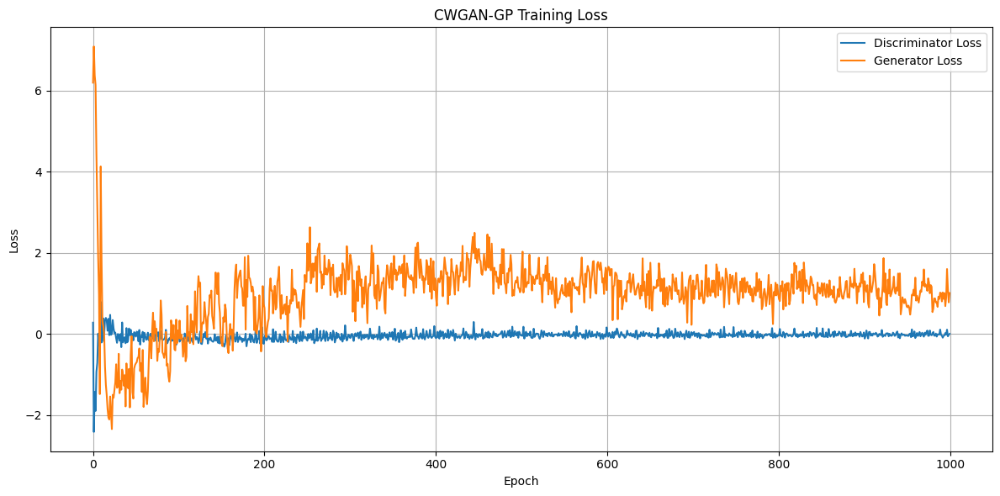

In [15]:
plot_gan_losses(cwgan_history)

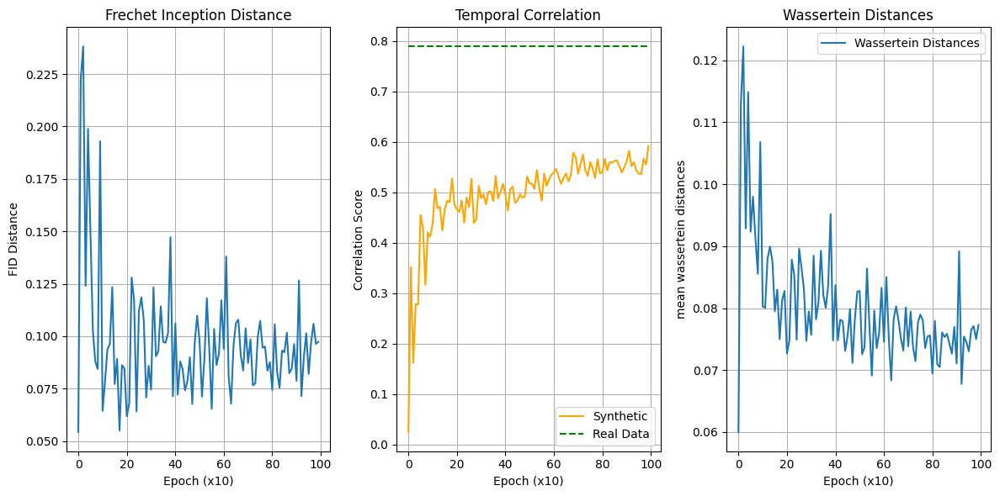

In [16]:
plot_gan_training_metrics(cwgan_monitor)

In [ ]:
# Save
cwgan.save("training/models/cwgangp/cwgan_gp_price_2_timeseries.keras")

# Load
#loaded_model = tf.keras.models.load_model(
#    "cwgan_gp_price_2_timeseries",
#    custom_objects={"CWGAN_GP": CWGAN_GP}
#)

In [17]:
# Generate synthetic data using conditions
noise = tf.random.normal([X_train_cwgan.shape[0], 128])
cwgan_synthetic_data = cwgan.generator.predict([noise, C_train_cwgan])
print(cwgan_synthetic_data.shape)  # Should be (num, 24, 21)

17/17 [==============================] - 0s 9ms/step
(536, 24, 21)


In [18]:
country_names = df_2.columns.tolist()[1:] 


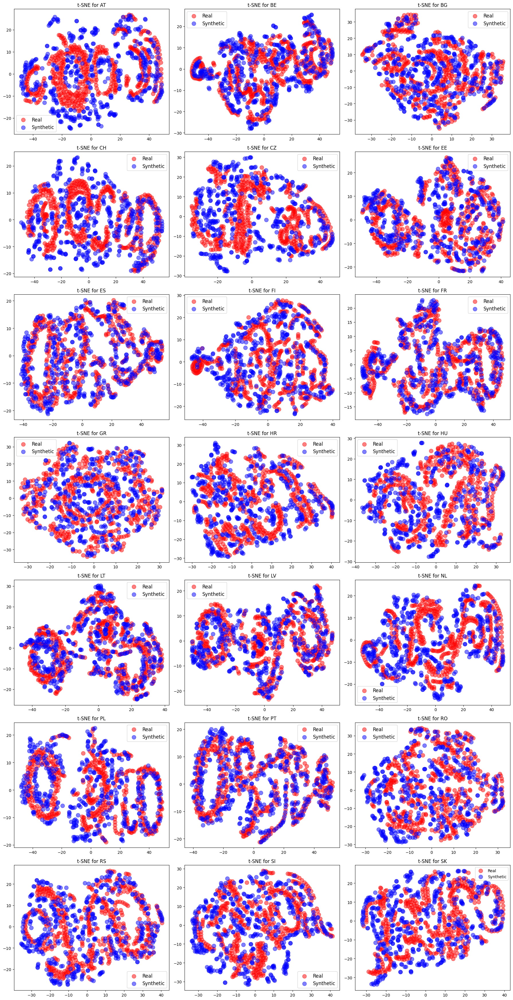

In [19]:
plot_feature_tsne(X_train_cwgan, cwgan_synthetic_data, country_names)

In [20]:
reconstructed_cwgan_synthetic_consecutive = reconstruct_synthetic_consecutive(
    cwgan_scaler,
    cwgan_synthetic_data, 
    P_train_cwgan
)


In [21]:
reconstructed_cwgan_real_consecutive = reconstruct_synthetic_consecutive(
    cwgan_scaler,
    X_train_cwgan, 
    P_train_cwgan
)

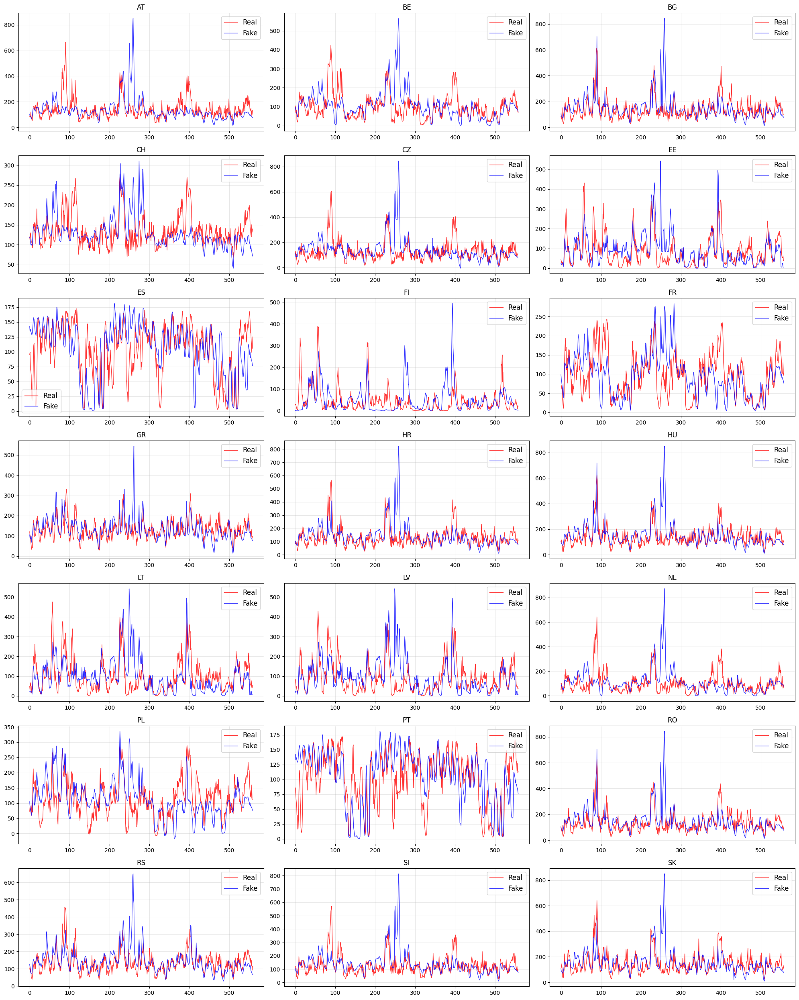

In [22]:
plot_real_vs_fake(reconstructed_cwgan_synthetic_consecutive, reconstructed_cwgan_real_consecutive, column_names=country_names)

In [23]:
# Build models
wgan_generator = build_wgan_generator(latent_dim=latent_dim, window_size=window_size, num_features=num_features)
wgan_discriminator = build_wgan_discriminator(window_size=window_size, num_features=num_features)
    
# Compile
wgan = WGAN_GP(critic=wgan_discriminator, generator=wgan_generator, latent_dim=latent_dim, n_critic = 2, gp_weight=10.0)
wgan.compile(
    c_optimizer=tf.keras.optimizers.Adam(0.001, beta_1=0.0, beta_2=0.9),
    g_optimizer=tf.keras.optimizers.Adam(0.001, beta_1=0.0, beta_2=0.9)
)

In [24]:
wgan_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath="training/checkpoints/wgan-gp/checkpoint_{epoch}.weights.h5",
    save_weights_only=True,
    save_freq=100*32  # Save every 100 batches
)

In [25]:
# Create dataset
train_wgan_ds = tf.data.Dataset.from_tensor_slices(X_train_cwgan).batch(200)

In [26]:
# Train with monitoring
wgan_monitor = WGANMonitor(X_test_cwgan, latent_dim=latent_dim, window_size=window_size, num_features=num_features)

In [27]:
# Training execution
wgan_history = wgan.fit(
    train_wgan_ds,
    epochs=1000,  # Train longer
    callbacks=[wgan_checkpoint, wgan_monitor]
)

Epoch 1/1000
3/3 [==============================] - 7s 291ms/step - c_loss: 1.9870 - g_loss: 4.2738
Epoch 2/1000
3/3 [==============================] - 1s 295ms/step - c_loss: -1.5750 - g_loss: 6.8470
Epoch 3/1000
3/3 [==============================] - 1s 294ms/step - c_loss: -0.6156 - g_loss: 4.5857
Epoch 4/1000
3/3 [==============================] - 1s 363ms/step - c_loss: 0.3066 - g_loss: 3.2193
Epoch 5/1000
3/3 [==============================] - 1s 293ms/step - c_loss: 0.6622 - g_loss: 1.4479
Epoch 6/1000
3/3 [==============================] - 1s 321ms/step - c_loss: 0.7721 - g_loss: 0.0194
Epoch 7/1000
3/3 [==============================] - 1s 292ms/step - c_loss: 1.4997 - g_loss: -0.7569
Epoch 8/1000
3/3 [==============================] - 1s 300ms/step - c_loss: 1.9484 - g_loss: 0.5747
Epoch 9/1000
3/3 [==============================] - 1s 296ms/step - c_loss: 1.8197 - g_loss: 1.0422
Epoch 10/1000
3/3 [==============================] - ETA: 0s - c_loss: 1.7707 - g_loss: 0.4383
Ep

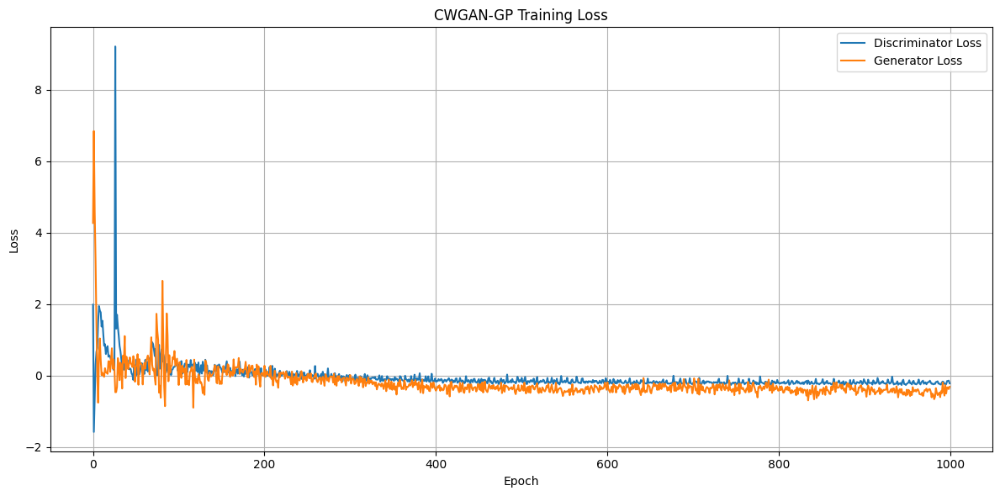

In [28]:
plot_gan_losses(wgan_history)

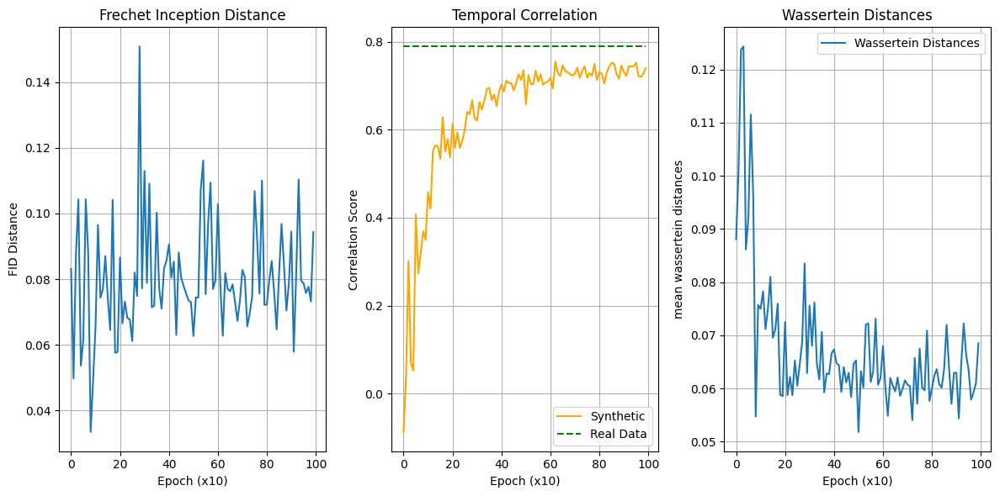

In [29]:
plot_gan_training_metrics(wgan_monitor)

In [ ]:
# Save
wgan.save("training/models/wgangp/wgan_gp_price_2_timeseries.keras")

# Load
#loaded_model = keras.models.load_model(
#    "wgan_gp_price_2_timeseries",
#    custom_objects={"WGAN_GP": WGAN_GP}
#)

In [30]:
# Generate synthetic data
wgan_noise = tf.random.normal([len(X_train_cwgan), 128])
wgan_synthetic_data = wgan.generator.predict(wgan_noise)
print(wgan_synthetic_data.shape)  # Should be (num, 24, 21)

17/17 [==============================] - 1s 24ms/step
(536, 24, 21)


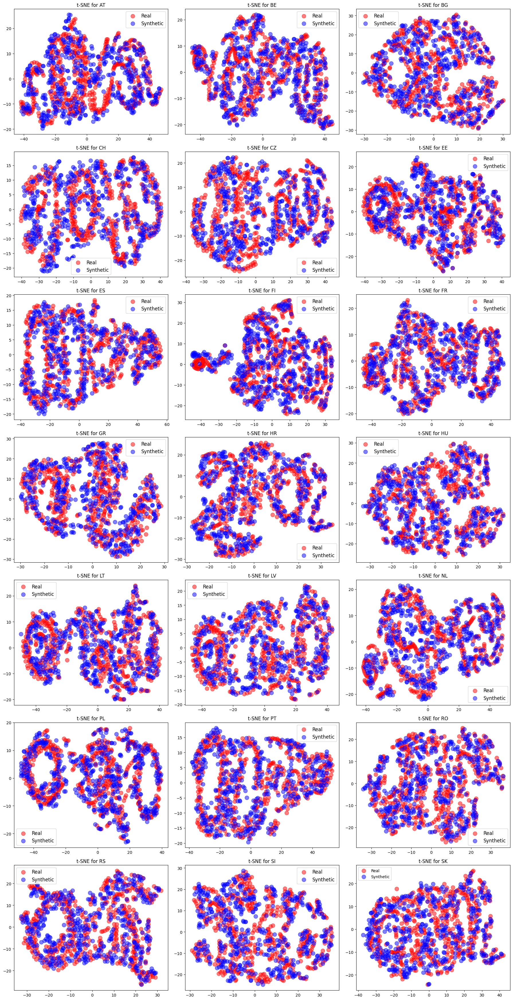

In [31]:
plot_feature_tsne(X_train_cwgan, wgan_synthetic_data, country_names)

In [32]:
reconstructed_wgan_synthetic_consecutive = reconstruct_synthetic_consecutive(
    cwgan_scaler,
    wgan_synthetic_data, 
    P_train_cwgan
)


In [33]:
reconstructed_wgan_real_consecutive = reconstruct_synthetic_consecutive(
    cwgan_scaler,
    X_train_cwgan, 
    P_train_cwgan
)

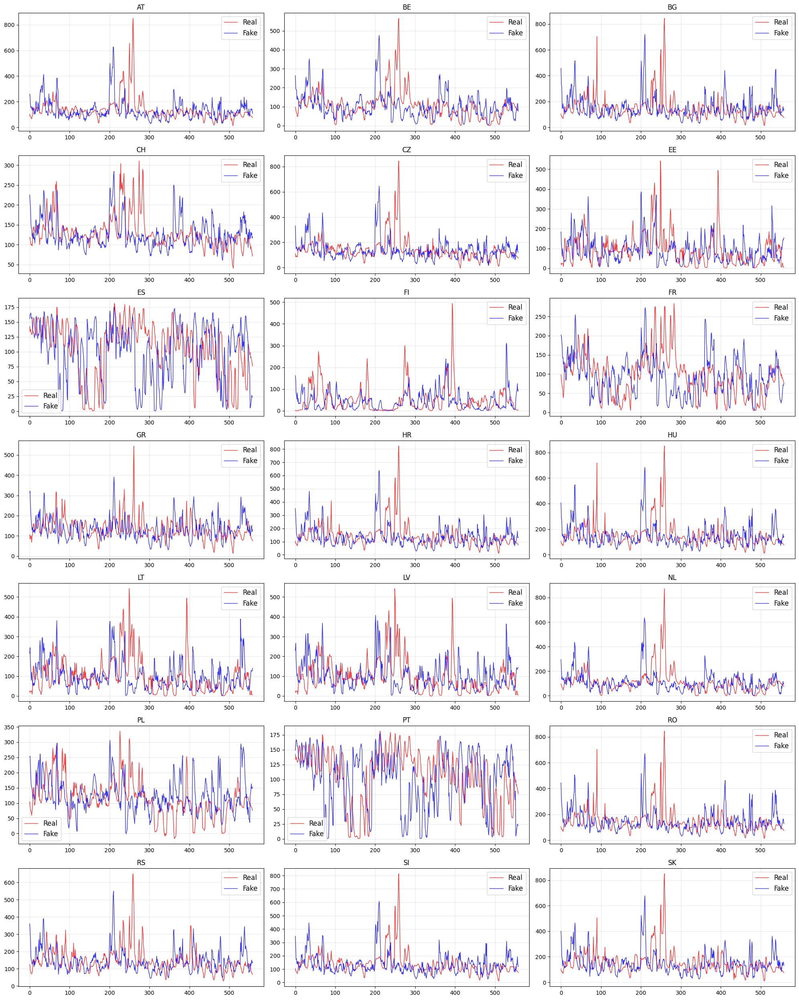

In [34]:
plot_real_vs_fake(reconstructed_wgan_real_consecutive, reconstructed_wgan_synthetic_consecutive, column_names=country_names)